In [1]:
import os
import torch
import numpy as np
from PIL import Image
from torchvision import models, transforms

data_dir = "D:\\Trade-Off_CBIR\\dataset\\Corel-1K"
data_dir_GHIM = "D:\\Trade-Off_CBIR\\dataset\\GHIM-10K"

print("Classes available (Corel-1K):", os.listdir(data_dir))
print("Classes available (GHIM-10K):", os.listdir(data_dir_GHIM))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Classes available (Corel-1K): ['africans', 'beaches', 'buildings', 'buses', 'dinosaurs', 'elephants', 'flowers', 'food', 'horses', 'mountains']
Classes available (GHIM-10K): ['aircraft', 'buildings', 'butterfly', 'cars', 'dragon fly', 'fireworks', 'flowers', 'hen', 'horses', 'insects', 'motorcycles', 'mountains', 'sea shores', 'ships', 'sunset', 'temples', 'trees', 'valleys', 'walls', 'yacht']
Using device: cpu


## Tahap 1: Ekstraksi Fitur

In [4]:
import torch
from torchvision import models, transforms
import timm

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# --- Model 1: ViT Base ---
vit_b16 = models.vit_b_16(weights=models.ViT_B_16_Weights.DEFAULT).to(device).eval()

# --- Model 2: ViT Large ---
vit_l16 = models.vit_l_16(weights=models.ViT_L_16_Weights.DEFAULT).to(device).eval()

# --- Model 3: DeiT Base ---
deit = timm.create_model('deit_base_patch16_224', pretrained=True).to(device).eval()

# --- Transform standar untuk semua model ---
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# --- Catatan ---
# Gunakan .forward_features() untuk ViT/DeiT untuk ambil embedding sebelum classifier
# Flatten + L2-normalize hasil embedding sebelum digunakan untuk CBIR


Downloading: "https://download.pytorch.org/models/vit_l_16-852ce7e3.pth" to C:\Users\acer/.cache\torch\hub\checkpoints\vit_l_16-852ce7e3.pth


100%|██████████| 1.13G/1.13G [03:26<00:00, 5.88MB/s]


## Tahap 2: Pre-trained Models

In [5]:
import time
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import torch
import torch.nn.functional as F

def extract_features(model, img_tensor, model_name=None):
    """
    Ambil embedding sebelum classifier, flatten, L2-normalize
    """
    model.eval()
    with torch.no_grad():
        # ViT models
        if model_name in ['vit_b16', 'vit_l16']:
            try:
                feat = model.forward_features(img_tensor)
            except AttributeError:
                feat = model(img_tensor)
        # DeiT via timm
        elif model_name == 'deit':
            if hasattr(model, 'forward_features'):
                feat = model.forward_features(img_tensor)
            else:
                feat = model(img_tensor)
        else:
            feat = model(img_tensor)
        
        # Jika output 4D (batch, channels, H, W)
        if feat.dim() == 4:
            feat = F.adaptive_avg_pool2d(feat, 1)
            feat = torch.flatten(feat, 1)
        else:
            feat = feat.flatten(start_dim=1)
        
        # L2-normalize
        feat = F.normalize(feat, p=2, dim=1)
        
    return feat.cpu().numpy()

# ----------------------------------------
# Measure inference speed
# ----------------------------------------
def measure_inference_speed(model, sample_img, transform, device='cuda', model_name=None):
    img_t = transform(sample_img).unsqueeze(0).to(device)
    if device=='cuda':
        torch.cuda.synchronize()
    start = time.time()
    _ = extract_features(model, img_t, model_name)
    if device=='cuda':
        torch.cuda.synchronize()
    end = time.time()
    return end - start

# ----------------------------------------
# Measure embedding metrics (inter/intra-class similarity)
# ----------------------------------------
def measure_embedding_metrics(features, labels):
    """
    features: np.array, shape=(N, D)
    labels: list/array, class label per fitur
    """
    start = time.time()
    sims = cosine_similarity(features, features)
    search_time = time.time() - start

    # Inter-class similarity
    inter_dists = []
    classes = list(set(labels))
    for i, cls_i in enumerate(classes):
        idx_i = [k for k,l in enumerate(labels) if l==cls_i]
        for j, cls_j in enumerate(classes):
            if i >= j:
                continue
            idx_j = [k for k,l in enumerate(labels) if l==cls_j]
            inter_dists.append(np.mean(sims[np.ix_(idx_i, idx_j)]))
    
    # Intra-class similarity
    intra_dists = []
    for cls in classes:
        idx = [k for k,l in enumerate(labels) if l==cls]
        intra_dists.append(np.mean(sims[np.ix_(idx, idx)]))
    
    return search_time, np.mean(inter_dists), np.mean(intra_dists)

# ----------------------------------------
# Contoh penggunaan:
# models_dict = {'ViT-B16': vit_b16, 'ViT-L16': vit_l16, 'DeiT': deit}
# for name, model in models_dict.items():
#     t_inf = measure_inference_speed(model, sample_img, transform, device, model_name=name.lower())
#     print(f"{name} inference speed: {t_inf:.4f}s")


In [6]:
from tqdm import tqdm
import torch
import numpy as np
from PIL import Image
import os
from sklearn.preprocessing import normalize  # untuk L2-normalisasi
import torch.nn.functional as F

# --------------------------
# List semua file dan label
# --------------------------
img_paths = []
labels = []

for cls in os.listdir(data_dir):
    cls_path = os.path.join(data_dir, cls)
    for f in os.listdir(cls_path):
        img_paths.append(os.path.join(cls_path, f))
        labels.append(cls)

# --------------------------
# Fungsi ekstraksi fitur
# --------------------------
def extract_features(model, img_tensor, model_name=None):
    model.eval()
    with torch.no_grad():
        # ViT models
        if model_name in ['vit_b16', 'vit_l16']:
            try:
                feat = model.forward_features(img_tensor)
            except AttributeError:
                feat = model(img_tensor)
        # DeiT via timm
        elif model_name == 'deit':
            if hasattr(model, 'forward_features'):
                feat = model.forward_features(img_tensor)
            else:
                feat = model(img_tensor)
        else:
            feat = model(img_tensor)

        # Jika 4D, adaptive avg pooling + flatten
        if feat.dim() == 4:
            feat = F.adaptive_avg_pool2d(feat, 1)
            feat = torch.flatten(feat, 1)
        else:
            feat = feat.flatten(start_dim=1)

        # L2-normalize
        feat = F.normalize(feat, p=2, dim=1)

    return feat.cpu().numpy()

# --------------------------
# Ekstraksi fitur untuk semua model
# --------------------------
vit_b16_features = []
vit_l16_features = []
deit_features = []

for path in tqdm(img_paths, desc="Extracting Transformer Features"):
    img = Image.open(path).convert('RGB')
    img_t = transform(img).unsqueeze(0).to(device)

    # ViT-B16
    vit_b16_feat = extract_features(vit_b16, img_t, model_name='vit_b16')
    vit_b16_features.append(vit_b16_feat.squeeze())

    # ViT-L16
    vit_l16_feat = extract_features(vit_l16, img_t, model_name='vit_l16')
    vit_l16_features.append(vit_l16_feat.squeeze())

    # DeiT Base
    deit_feat = extract_features(deit, img_t, model_name='deit')
    deit_features.append(deit_feat.squeeze())

# --------------------------
# Convert ke numpy array
# --------------------------
vit_b16_features = np.array(vit_b16_features)
vit_l16_features = np.array(vit_l16_features)
deit_features = np.array(deit_features)

# --------------------------
# L2-normalisasi tambahan (opsional, sudah di-normalize di fungsi)
# --------------------------
vit_b16_features = normalize(vit_b16_features)
vit_l16_features = normalize(vit_l16_features)
deit_features = normalize(deit_features)


Extracting Transformer Features: 100%|██████████| 1000/1000 [17:23<00:00,  1.04s/it]


## Tahap 3: Image Retrieval & Similarity Matching

In [7]:
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import numpy as np

# ===============================
# Fungsi retrieve top-K berdasarkan cosine similarity
# ===============================
def retrieve(query_feat, all_feats, top_k=10):
    """
    query_feat: np.array, shape=(dim,)
    all_feats: np.array, shape=(N, dim)
    """
    sims = cosine_similarity([query_feat], all_feats)[0]  # type: ignore
    idxs = np.argsort(sims)[::-1][:top_k]
    return idxs

# ===============================
# Fungsi evaluasi Recall@K & Precision@K per kelas
# ===============================
def evaluate_recall_precision(features, labels, top_k=10):
    """
    features: numpy array, shape=(N, dim_feature), L2-normalized embedding
    labels: list of length N
    top_k: int, jumlah top retrieved images
    """
    classes = sorted(list(set(labels)))
    results = []

    for cls in classes:
        # indeks query untuk kelas tertentu
        idxs_cls = [i for i, l in enumerate(labels) if l == cls]
        R_list, P_list = [], []

        for q in idxs_cls:
            retrieved_idx = retrieve(features[q], features, top_k)
            retrieved_labels = [labels[i] for i in retrieved_idx]

            # Recall = jumlah retrieved benar / total data kelas
            R = retrieved_labels.count(cls) / len(idxs_cls)
            # Precision = jumlah retrieved benar / top_k
            P = retrieved_labels.count(cls) / top_k

            R_list.append(R)
            P_list.append(P)

        results.append([cls, np.mean(R_list), np.mean(P_list)])

    df = pd.DataFrame(results, columns=['Class','R','P'])
    
    # Tambahkan row Mean keseluruhan
    mean_row = {
        'Class': 'Mean',
        'R': df['R'].mean(),
        'P': df['P'].mean()
    }
    df = pd.concat([df, pd.DataFrame([mean_row])], ignore_index=True)
    
    # Format angka 4 desimal
    df['R'] = df['R'].astype(float).map("{:.4f}".format)
    df['P'] = df['P'].astype(float).map("{:.4f}".format)

    return df

# ===============================
# Contoh penggunaan untuk model Transformer
# ===============================
# models_dict = {'ViT-B16': vit_b16_features, 'ViT-L16': vit_l16_features, 'DeiT': deit_features}
# for name, feats in models_dict.items():
#     df_metrics = evaluate_recall_precision(feats, labels, top_k=10)
#     print(f"=== {name} ===")
#     print(df_metrics)


## Tahap 4: Evaluasi

In [8]:
from PIL import Image
import pandas as pd

# --- Ambil sample image untuk inference speed ---
sample_img = Image.open(img_paths[0]).convert('RGB')

# --- Measure inference speed ---
vitb16_time = measure_inference_speed(vit_b16, sample_img, transform, device=str(device), model_name='vit_b16')
vitl16_time = measure_inference_speed(vit_l16, sample_img, transform, device=str(device), model_name='vit_l16')
deit_time = measure_inference_speed(deit, sample_img, transform, device=str(device), model_name='deit')

# --- Measure embedding metrics (cosine similarity) ---
vitb16_search, vitb16_inter, vitb16_intra = measure_embedding_metrics(vit_b16_features, labels)
vitl16_search, vitl16_inter, vitl16_intra = measure_embedding_metrics(vit_l16_features, labels)
deit_search, deit_inter, deit_intra = measure_embedding_metrics(deit_features, labels)

# --- Buat DataFrame hasil evaluasi ---
df_metrics = pd.DataFrame({
    'Model': ['ViT-B16', 'ViT-L16', 'DeiT Base'],
    'Inference speed (s/img)': [vitb16_time, vitl16_time, deit_time],
    'Embedding search time (s)': [vitb16_search, vitl16_search, deit_search],
    'Inter-class dist': [vitb16_inter, vitl16_inter, deit_inter],
    'Intra-class dist': [vitb16_intra, vitl16_intra, deit_intra]
})

display(df_metrics)


,Model,Inference speed (s/img),Embedding search time (s),Inter-class dist,Intra-class dist
0,ViT-B16,0.231076,0.015000,0.018716,0.511832
1,ViT-L16,0.595527,0.011228,0.014774,0.515237
2,DeiT Base,0.185869,1.421969,0.080617,0.273018


In [9]:
# ===============================
# Evaluasi CBIR / Retrieval untuk model Transformer
# ===============================
df_vitb16 = evaluate_recall_precision(vit_b16_features, labels)
df_vitl16 = evaluate_recall_precision(vit_l16_features, labels)
df_deit   = evaluate_recall_precision(deit_features, labels)

# Membuat tabel per kelas
df_table = pd.DataFrame()
df_table['Class'] = sorted(list(set(labels)))  # daftar kelas unik

# Recall & Precision per model
df_table['ViT-B16 R'] = df_vitb16['R'].astype(float)
df_table['ViT-B16 P'] = df_vitb16['P'].astype(float)

df_table['ViT-L16 R'] = df_vitl16['R'].astype(float)
df_table['ViT-L16 P'] = df_vitl16['P'].astype(float)

df_table['DeiT Base R'] = df_deit['R'].astype(float)
df_table['DeiT Base P'] = df_deit['P'].astype(float)

# MEAN per kolom
mean_row = {
    'Class': 'Mean',
    'ViT-B16 R': df_table['ViT-B16 R'].mean(),
    'ViT-B16 P': df_table['ViT-B16 P'].mean(),
    'ViT-L16 R': df_table['ViT-L16 R'].mean(),
    'ViT-L16 P': df_table['ViT-L16 P'].mean(),
    'DeiT Base R': df_table['DeiT Base R'].mean(),
    'DeiT Base P': df_table['DeiT Base P'].mean(),
}

df_table = pd.concat([df_table, pd.DataFrame([mean_row])], ignore_index=True)

# Format angka 4 desimal (setelah semua mean dihitung)
for col in df_table.columns[1:]:
    df_table[col] = df_table[col].map("{:.4f}".format)

# Tampilkan tabel
display(df_table)


,Class,ViT-B16 R,ViT-B16 P,ViT-L16 R,ViT-L16 P,DeiT Base R,DeiT Base P
0,africans,0.0938,0.9380,0.0919,0.9190,0.0895,0.8950
1,beaches,0.0979,0.9790,0.0982,0.9820,0.0974,0.9740
2,buildings,0.0966,0.9660,0.0967,0.9670,0.0951,0.9510
3,buses,0.1000,1.0000,0.1000,1.0000,0.1000,1.0000
4,dinosaurs,0.1000,1.0000,0.1000,1.0000,0.1000,1.0000
5,elephants,0.1000,1.0000,0.1000,1.0000,0.1000,1.0000
6,flowers,0.1000,1.0000,0.1000,1.0000,0.1000,1.0000
7,food,0.0992,0.9920,0.0995,0.9950,0.0964,0.9640
8,horses,0.1000,1.0000,0.1000,1.0000,0.1000,1.0000
9,mountains,0.0995,0.9950,0.0994,0.9940,0.0998,0.9980


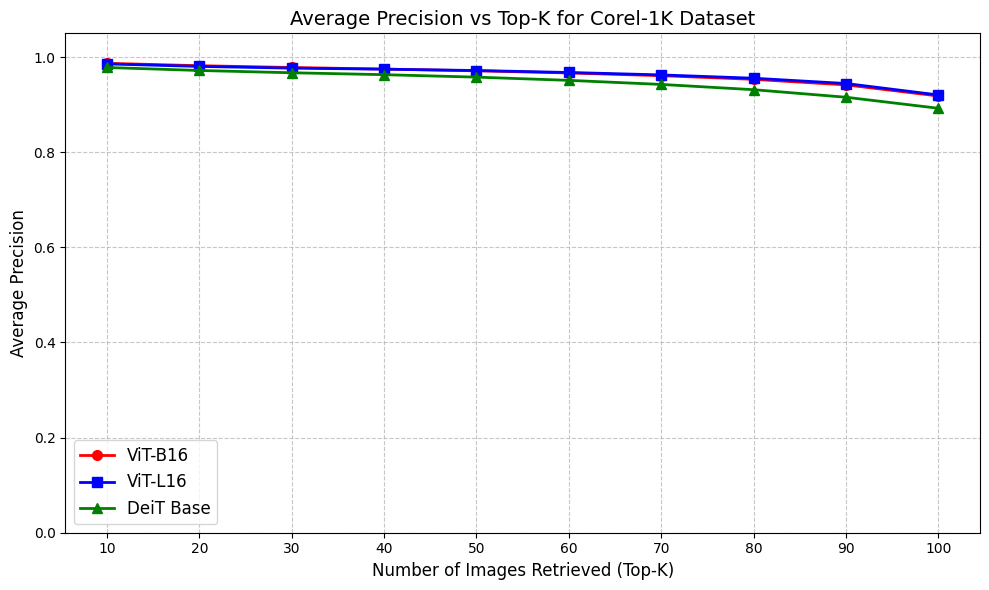

In [10]:
import matplotlib.pyplot as plt

def average_precision_vs_topk(features_list, labels, top_k_max=100):
    top_ks = list(range(10, top_k_max + 1, 10))
    avg_prec = {name: [] for name in features_list}

    # Hitung Average Precision untuk setiap Top-K
    for top_k in top_ks:
        for name, feats in features_list.items():
            df = evaluate_recall_precision(feats, labels, top_k=top_k)
            
            # Pastikan kolom 'P' float
            df['P'] = df['P'].astype(float)
            
            avg_prec[name].append(df['P'].mean())

    plt.figure(figsize=(10, 6))

    # Marker dan warna per model Transformer
    markers = {
        'ViT-B16': 'o',
        'ViT-L16': 's',
        'DeiT Base': '^'
    }

    colors = {
        'ViT-B16': 'red',
        'ViT-L16': 'blue',
        'DeiT Base': 'green'
    }

    # Plot Average Precision vs Top-K
    for name in features_list:
        plt.plot(top_ks, avg_prec[name],
                 marker=markers.get(name, 'o'),
                 color=colors.get(name, 'black'),
                 linestyle='-',
                 linewidth=2,
                 markersize=7,
                 label=name)

    plt.xlabel("Number of Images Retrieved (Top-K)", fontsize=12)
    plt.ylabel("Average Precision", fontsize=12)
    plt.title("Average Precision vs Top-K for Corel-1K Dataset", fontsize=14)
    plt.xticks(top_ks)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(fontsize=12)
    plt.ylim(0, 1.05)
    plt.tight_layout()
    plt.show()

# Dictionary fitur terbaru untuk model Transformer
features_dict = {
    'ViT-B16': vit_b16_features,
    'ViT-L16': vit_l16_features,
    'DeiT Base': deit_features
}

# Jalankan evaluasi dan plot
average_precision_vs_topk(features_dict, labels, top_k_max=100)


In [11]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def show_topk_cbir(features, labels, img_paths, top_k=4, model_name="Model"):
    """
    Menampilkan query image + top-K retrieved images dengan bounding box:
    - Biru untuk query
    - Hijau jika label sama (benar), merah jika salah
    """
    classes = sorted(list(set(labels)))

    for cls in classes:
        # ambil 1 query per kelas (bisa diubah untuk beberapa query)
        idxs_cls = [i for i, l in enumerate(labels) if l == cls]
        query_idx = idxs_cls[0]

        # retrieve top-K
        retrieved_idx = retrieve(features[query_idx], features, top_k)

        plt.figure(figsize=(15, 3))
        plt.suptitle(f"{model_name} - Query Class: {cls}", fontsize=14)

        # Query image
        query_img = Image.open(img_paths[query_idx]).convert('RGB')
        plt.subplot(1, top_k + 1, 1)
        plt.imshow(query_img)
        plt.axis('off')
        plt.title("Query", fontsize=10)
        plt.gca().add_patch(patches.Rectangle((0,0), query_img.width, query_img.height,
                                              edgecolor='blue', fill=False, linewidth=3))

        # Retrieved images
        for i, idx in enumerate(retrieved_idx):
            img = Image.open(img_paths[idx]).convert('RGB')
            plt.subplot(1, top_k + 1, i + 2)
            plt.imshow(img)
            plt.axis('off')
            color = 'green' if labels[idx] == cls else 'red'
            plt.gca().add_patch(patches.Rectangle((0,0), img.width, img.height,
                                                  edgecolor=color, fill=False, linewidth=3))
            plt.title(labels[idx], fontsize=9)

        plt.tight_layout()
        plt.show()


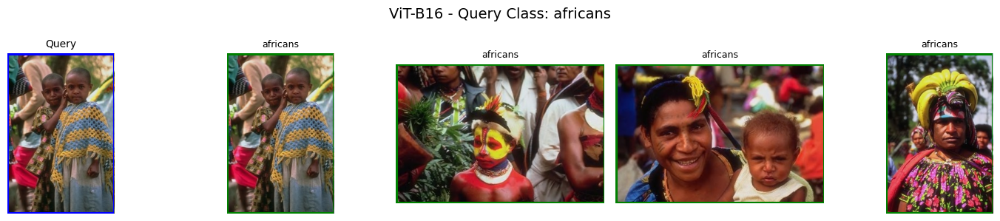

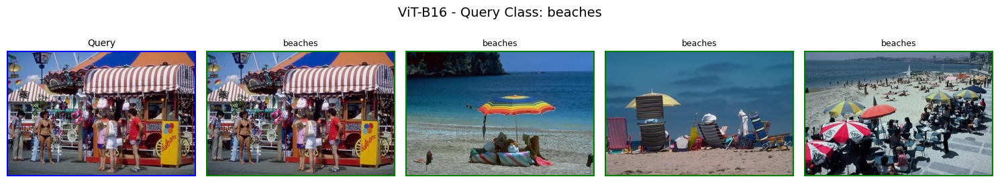

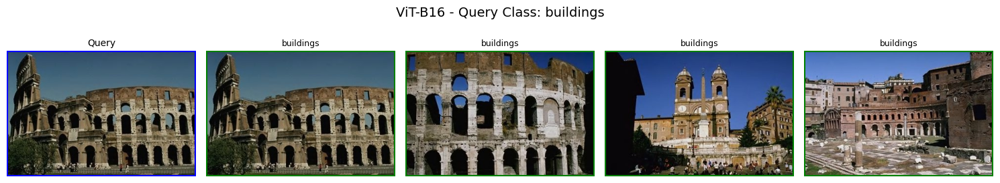

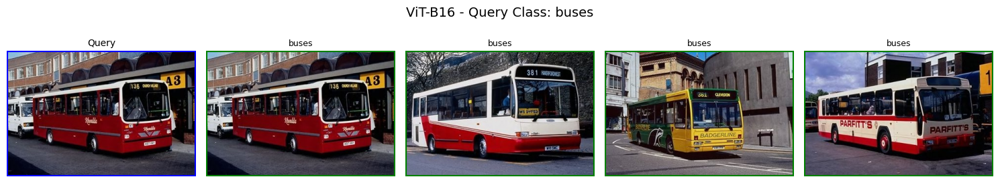

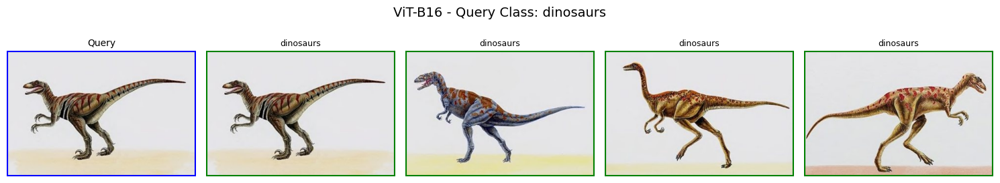

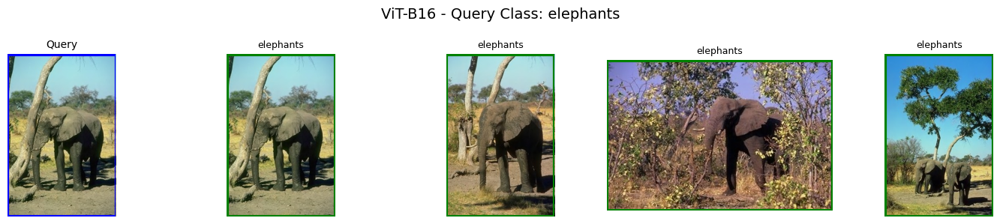

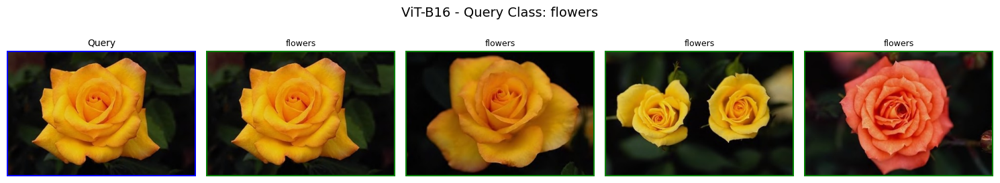

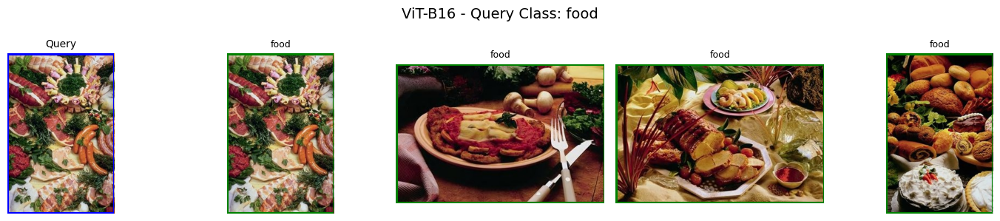

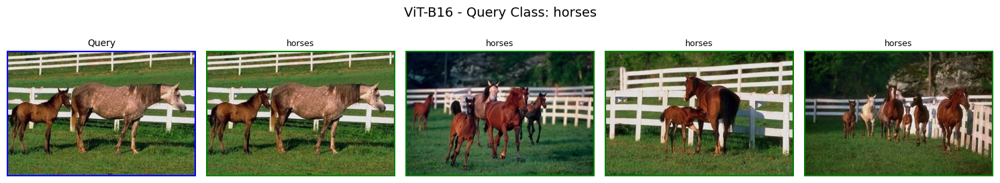

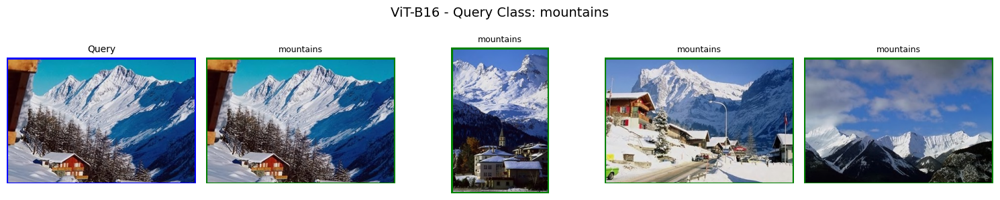

In [12]:
show_topk_cbir(vit_b16_features, labels, img_paths, top_k=4, model_name="ViT-B16")

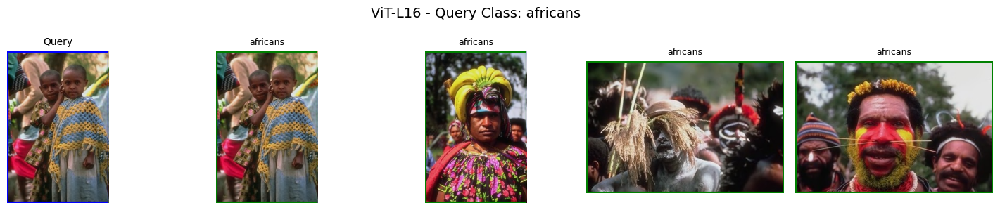

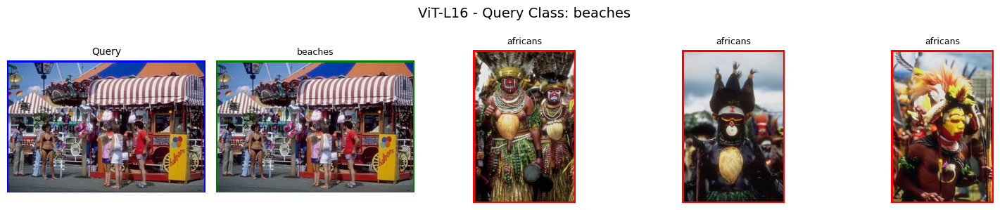

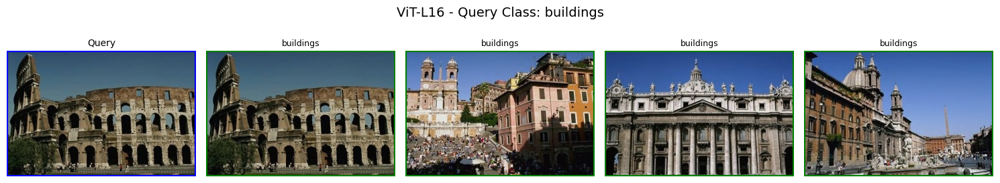

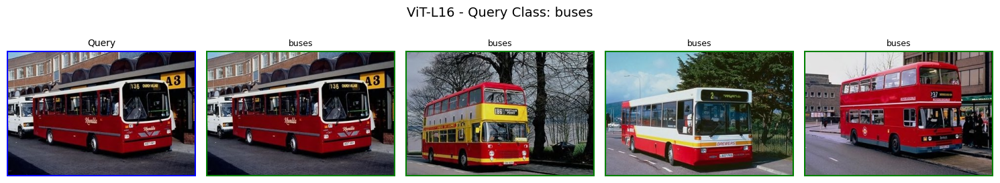

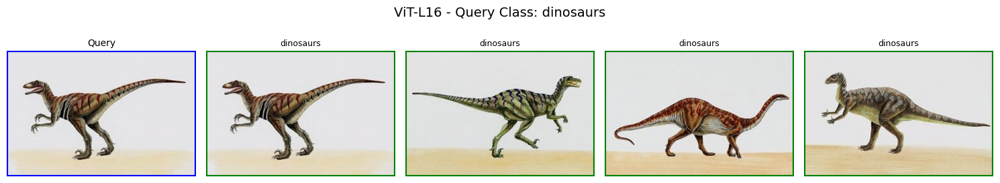

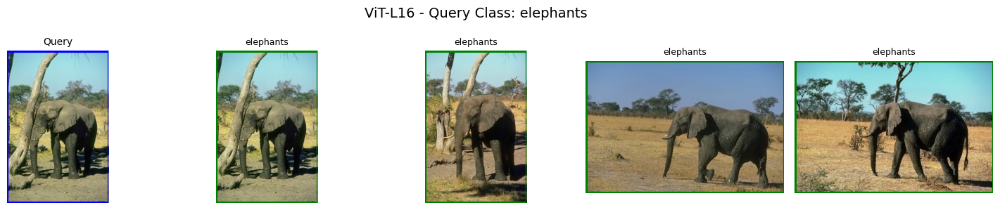

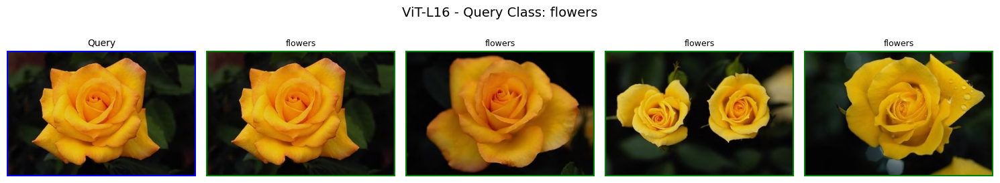

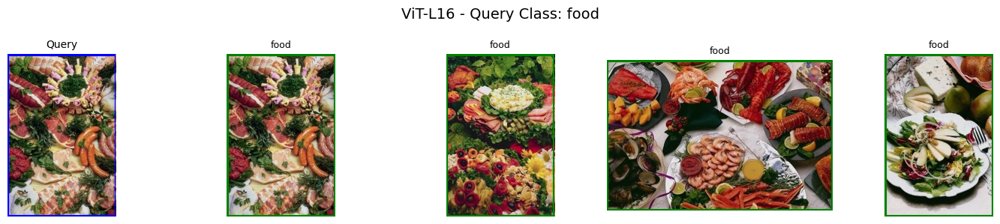

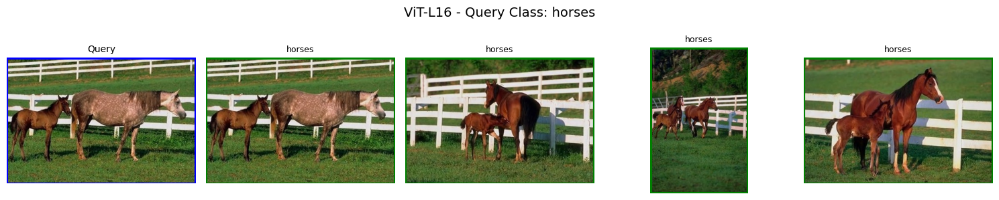

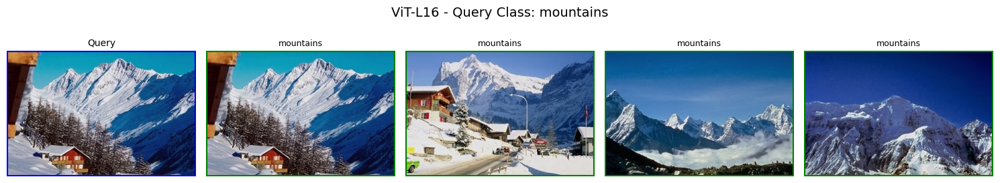

In [13]:
show_topk_cbir(vit_l16_features, labels, img_paths, top_k=4, model_name="ViT-L16")

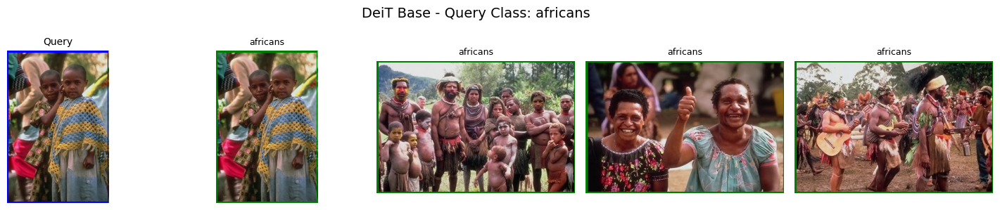

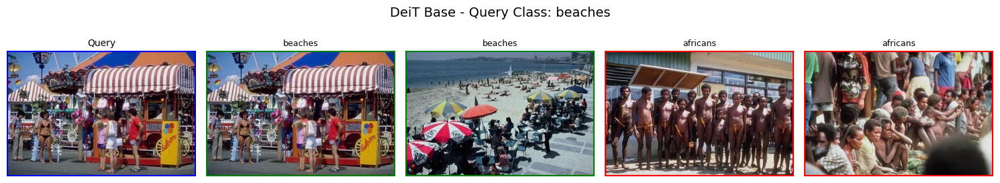

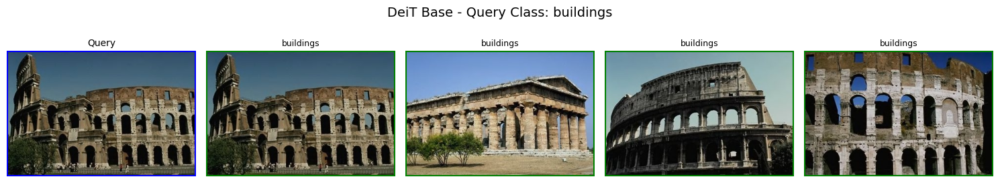

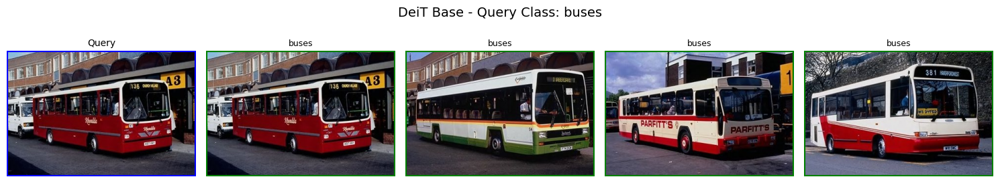

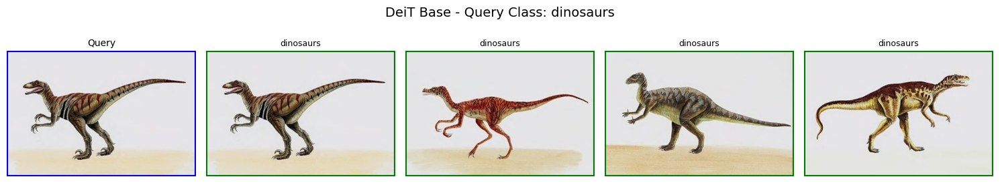

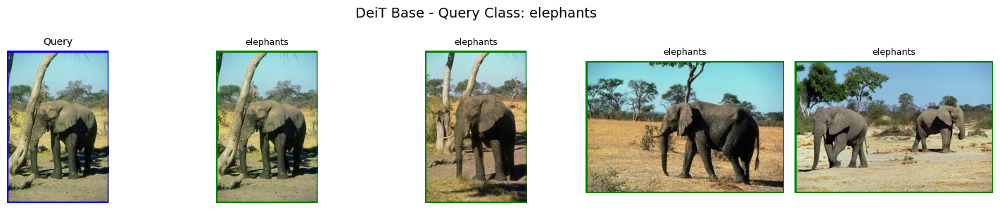

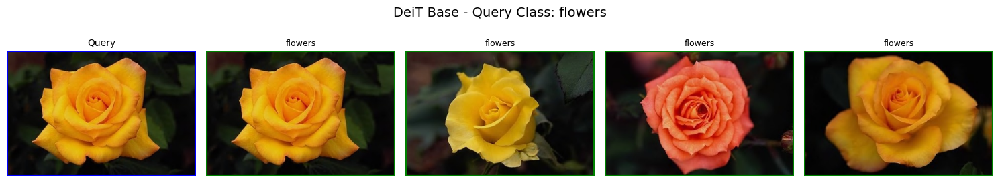

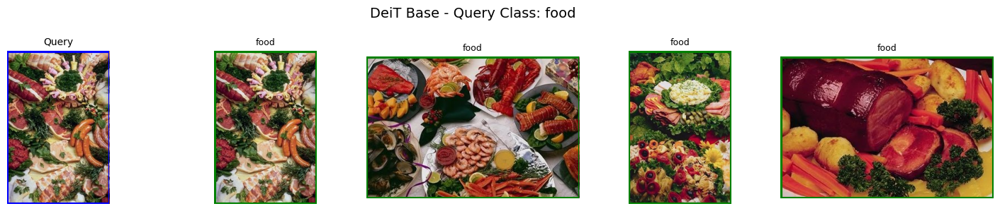

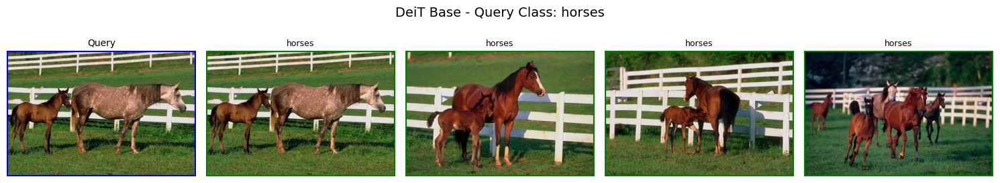

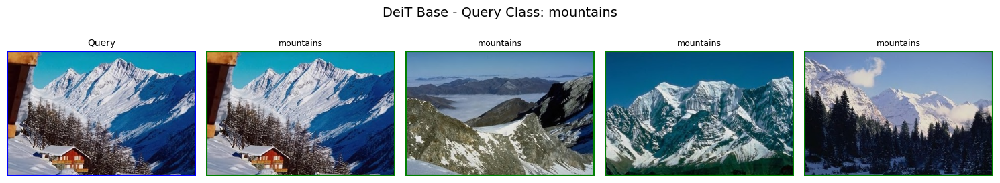

In [14]:
show_topk_cbir(deit_features, labels, img_paths, top_k=4, model_name="DeiT Base")